In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import os
import pickle
import seaborn as sns
import scipy
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import ListedColormap
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon


# 
import ast
import folium
import io
from PIL import Image
import selenium
import json
import geopandas as gpd
import contextily as cx

## Load inputs

### Load the coordinates of individual building locations

In [4]:
## Build a dictionary between location and coordinates
archetypes = {}

BRAILS_input = pd.read_excel('Archetypes large building inv.xlsx',header = 0)
BRAILS_input['building_ID'] = BRAILS_input.index+1

for row in BRAILS_input.iterrows(): 
    archetypes[row[0]+1] = row[1]['Lat':'Lon']
    

In [ ]:
# Add some information to the dataframe : 
BRAILS_input['Total floor area'] = BRAILS_input['NumberOfStories']*BRAILS_input['PlanArea']
BRAILS_input['Archetype_combos'] = BRAILS_input['base_type']+'-' + BRAILS_input['cladding']
display(BRAILS_input)

In [6]:
# Grouping schemes : 
Base_archetypes_dict = dict(zip(BRAILS_input.building_ID, BRAILS_input.base_type))
print(f'Unique archetypes : {set(Base_archetypes_dict.values())}')
Base_cladding_dict = dict(zip(BRAILS_input.building_ID, BRAILS_input.cladding))
print(f'Unique claddings : {set(Base_cladding_dict.values())}')
Base_archetype_combo_dict = dict(zip(BRAILS_input.building_ID, BRAILS_input.Archetype_combos))
print(f'Unique archetype combos : {set(Base_archetype_combo_dict.values())}')


Unique archetypes : {'W.MUH.2', 'W.MUH.1', 'C.ERB.L', 'W.MUH.3', 'W.SF.1', 'W.SF.2', 'M.SF.1'}
Unique claddings : {'Brick', 'Cedar', 'Vinyl'}
Unique archetype combos : {'W.MUH.2-Vinyl', 'W.MUH.3-Vinyl', 'W.MUH.2-Cedar', 'W.SF.2-Cedar', 'W.SF.2-Brick', 'W.MUH.2-Brick', 'C.ERB.L-Brick', 'W.SF.1-Brick', 'W.SF.1-Vinyl', 'C.ERB.L-Vinyl', 'W.SF.2-Vinyl', 'W.MUH.1-Vinyl', 'W.SF.1-Cedar', 'M.SF.1-Cedar'}


### Load the MC results

In [7]:
MC_results_format = 'pickle'

In [8]:
# Milepost investigated :
MP_investigated = 'MP45'

fname = f'{MP_investigated}-deagg_samples'

if MC_results_format != 'pickle': 
    xls = pd.ExcelFile(rel_fp)
    rel_fp = os.path.join(os.getcwd(),'deaggregated_MC_results',fname+'.xlsx')

    # Import raw monte carlo results 
    MC_results = {}
    MC_samples_count = 0

    for sheet in xls.sheet_names:
        MC_df = pd.read_excel(rel_fp,sheet_name=sheet, header = [0,1,2,3],index_col = 0, skiprows = [4,])
        MC_df = MC_df.iloc[:,:-1].dropna(how='all').dropna(axis = 1, how = 'all')
        MC_df = MC_df.fillna(0)
        MC_samples_count = max(MC_samples_count,MC_df.shape[0]) # Early MRIs might not record index 0 properly.
        MC_results[sheet] = MC_df

    
else : 
    rel_fp = os.path.join(os.getcwd(),'deaggregated_MC_results',fname+'.pickle')
    with open(rel_fp, 'rb') as f:
        MC_results = pickle.load(f)

lwr_bnd = -1*10**(-5) # Try not to filter out true 0s
upper_percentile_bnd = 99.5


cleansed_MC_results = {}

for MRI in MC_results.keys() :
    
    sim_df = MC_results[MRI]
    initial_size = sim_df.shape[0]  
    
    # Remove results below 0 : 
    cleansed_sim_df = sim_df[~(sim_df<lwr_bnd).any(axis=1)].reset_index(drop=True)   
    zero_cleanse = cleansed_sim_df.shape[0]
    
    # Remove outlier simulations : 
    groups = cleansed_sim_df.T.groupby(level=0)     
    mask_df = pd.DataFrame()
    
    for group in groups :        
        # Get row sums per LCIA method
        row_sums = group[1].T.sum(axis=1).to_numpy()

        # Upper bound for the MRI's indicator : 
        upper_bnd = np.percentile(row_sums,upper_percentile_bnd)
        # Note : using the "axis" option on np.percentile, directly with group[1] could
        # filter more unique outliers, instead of a row_sum outlier measure
               
        LCIA_outliers = pd.Series(row_sums>upper_bnd)
        LCIA_outliers.name = group[0]
        mask_df = pd.concat([mask_df,LCIA_outliers],axis=1)

    # Assess if any row is beyond the thresholds : 
    synthesis = (mask_df==True).any(axis=1)

    cleansed_sim_df2 = cleansed_sim_df[~synthesis]
    
    print(MRI, initial_size, cleansed_sim_df2.shape[0],f' - Removed {initial_size-zero_cleanse} for negatives,' 
          f' {synthesis.sum()} for outliers.')
    
    cleansed_MC_results[MRI] = cleansed_sim_df2

MC_results = cleansed_MC_results

list_MRIs = list(MC_results.keys())
list_LCIA_methods = list(MC_results[list_MRIs[0]].columns)
Amount_LCIA_methods = MC_results[list_MRIs[0]].shape[1]
print(list_MRIs)

19 10000 9915  - Removed 4 for negatives, 81 for outliers.
27 10000 9919  - Removed 20 for negatives, 61 for outliers.
39 10000 9862  - Removed 71 for negatives, 67 for outliers.
59 10000 9821  - Removed 98 for negatives, 81 for outliers.
92 10000 9744  - Removed 137 for negatives, 119 for outliers.
149 10000 9709  - Removed 156 for negatives, 135 for outliers.
249 10000 9679  - Removed 185 for negatives, 136 for outliers.
427 10000 9696  - Removed 173 for negatives, 131 for outliers.
753 10000 9678  - Removed 189 for negatives, 133 for outliers.
1367 10000 9689  - Removed 183 for negatives, 128 for outliers.
2548 10000 9669  - Removed 207 for negatives, 124 for outliers.
4879 10000 9728  - Removed 157 for negatives, 115 for outliers.
9585 10000 9704  - Removed 159 for negatives, 137 for outliers.
19316 10000 9708  - Removed 176 for negatives, 116 for outliers.
39909 10000 9686  - Removed 194 for negatives, 120 for outliers.
84503 10000 9712  - Removed 160 for negatives, 128 for outlie

## Add specific Milepost data

In [9]:
# Milepost investigated :
MP_investigated = 'MP45'

# Summary of the discretized hazard curve : 
wind_df = pd.read_excel('Discretized_mp_v4.xlsx',header = [0,1],index_col = 0)
wind_df = wind_df[MP_investigated] # Only show the milepost we're focusing on : 
Discrete_hazard_exceedances = wind_df['delta_lambda'].to_numpy()
display(wind_df)

,Midpoint MRI,3 Second Gust Midpoint Wind speed (miles per hr),delta_lambda
0,19,56.380946,0.017162
1,27,65.497865,0.013585
2,39,74.614783,0.010214
3,59,83.731702,0.007331
4,92,92.848621,0.005043
5,149,101.965540,0.003336
6,249,111.082459,0.002127
7,427,120.199378,0.001310
8,753,129.316297,0.000781
9,1367,138.433216,0.000451


In [10]:
MRI_lambdas = {}
for row in wind_df.iterrows(): 
    MRI_lambdas[str(int(row[1]['Midpoint MRI']))] = row[1]['delta_lambda']

# Compute losses per location

### Visuals - mean loss output per coordinate

In [13]:
filtered_MC_results = {}

for MRI in MC_results.keys() : 

    # Drop the archetype name
    df = MC_results[MRI].T.reset_index(level=3, drop=True)

    # Properly reformat the table, as intended : 
    L1 = []
    L2 = []
    L3 = []

    for item in df.index : 
        if MC_results_format != 'pickle' : 
            L1.append(ast.literal_eval(item[0]))
        else : 
            L1.append(item[0])
        L2.append(int(item[1]))
        L3.append(int(item[2]))
        tuples = list(zip(*[L1,L2,L3]))
    re_indexer = pd.MultiIndex.from_tuples(tuples, names=[None, None, None])

    # Re-index the dataframe
    df = pd.DataFrame(df.values, index =re_indexer, columns = df.columns) 
    
    MC_samples_count = df.shape[1]
    
    # Create a simulation mean for the relevant MRI : 
    df = pd.DataFrame(df.sum(axis =1)/MC_samples_count*MRI_lambdas[MRI], columns = [MRI])

    # Save the results to a variable :
    filtered_MC_results[MRI] = df

In [ ]:
summary_df = pd.DataFrame()

for MRI in filtered_MC_results.keys() : 
    summary_df = pd.concat([summary_df,filtered_MC_results[MRI]],axis = 1)

summary_df = summary_df.sort_index()
summary_df['Total'] = summary_df.sum(axis=1)
display(summary_df)

In [15]:
keywords_selected_LCIA_methods = ['World+', 'IPCC']

selected_LCIA = sorted(list(set([s for s in summary_df.index.get_level_values(0) if any(substr in s[0] for substr in keywords_selected_LCIA_methods)])))

In [ ]:
selected_LCIA

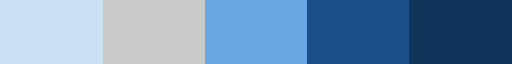

In [17]:
custom_colors = [
    '#11345A',
    '#194E86',
    '#69A4E3',
    '#C9C9C9',
    '#CDE1F6',    
]

# Mapping to ensure figures put highest priority color on top.
cmap_zorders = {
    '#C35164':6,
    custom_colors[0]:5,
    custom_colors[1]:4,
    custom_colors[2]:3,
    custom_colors[3]:2,
    custom_colors[4]:1,
}

# Create a ListedColormap
custom_cmap_segmented = ListedColormap(custom_colors[::-1]) # Reversed color order
custom_cmap_segmented.set_over('#C35164')
custom_cmap_segmented

In [21]:
from brails import Importer

LOCATION = 'Halifax, Canada'
LOCATION_TYPE = 'locationName' 

# Create an Importer instance:
importer = Importer()

# Create a region boundary:
region_boundary_class = importer.get_class('RegionBoundary')
region_boundary_object = region_boundary_class({'type': 'locationName',
                                                'data': LOCATION})


In [ ]:
SCRAPER = "OSM_FootprintScraper"

try : 
    print('Loading the back-up GeoJson (if available).')
    with open('Geo_data_OS2.json') as f:
        geojson_data = json.load(f)
        
    inventory_footprints = [b['geometry']['coordinates'][0] for b in geojson_data['features']]     

except : 
    # Scrape the building inventory from OSM:
    scraper_class = importer.get_class(SCRAPER)
    scraper = scraper_class({'length': 'ft'})
    scraper_inventory = scraper.get_footprints(region_boundary_object)
    
    # Used to label the assets 
    for asset in scraper_inventory.inventory : 
        scraper_inventory.add_asset_features(asset,{'id':asset},overwrite = False)    
    
    # Transform the data to a geojson file :
    geojson_data = scraper_inventory.get_geojson()
    # Save the resulting data (in case access to the data is later required)
    with open('Geo_data_OS2.json', 'w') as f:
        json.dump(geojson_data, f)
        
    # Extract building footprint coordinates from the inventory
    inventory_footprints, _ = scraper_inventory.get_coordinates()   


In [ ]:

# Flatten the nested coordinate lists into a single list of points
all_coords = [coord for path in inventory_footprints for coord in path]

# Calculate the geographic center of all footprints for map centering
center_lat = sum(point[1] for point in all_coords) / len(all_coords)
center_lon = sum(point[0] for point in all_coords) / len(all_coords)

# Initialize an interactive map centered on the footprints
m = folium.Map(
    location=(center_lat, center_lon),
    tiles="cartodbpositron",  # Light, clean basemap style
    zoom_start=13
)

# Add building footprints as a GeoJSON layer with tooltips showing height and area
folium.GeoJson(
    geojson_data,
    name="geojson",
    tooltip=folium.GeoJsonTooltip(fields=['id'], sticky=False),
    color = 'purple'
).add_to(m)
m

In [ ]:
gdf = gpd.GeoDataFrame.from_features(geojson_data["features"])
gdf.crs = "EPSG:4326"
display(gdf.head())


fig, ax = plt.subplots(1, 1, figsize = (12,16))
gdf.boundary.plot(ax = ax)
gdf.plot(ax=ax,alpha = 0.25,)
ax.set_axis_off()

cx.add_basemap(ax = ax, crs=gdf.crs,source=cx.providers.CartoDB.PositronNoLabels,zoom = 18)

current_bounds = gdf.total_bounds
            # MIN                             # MAX
ax.set(xlim = (current_bounds[0]-0.00025, current_bounds[2]+0.0005),
       ylim = (current_bounds[1]-0.001, current_bounds[3]+0.0002)
       )

In [26]:
coord_mapper = {}

for row in display_df.iterrows(): 
    row_ind = row[0]
    coords = [row[1]['Lon'],row[1]['Lat']]    
    for bldng in geojson_data['features'] : 
        geom = bldng['geometry']['coordinates'][0]
        if coords in geom :
            coord_mapper[row_ind] = bldng['properties']['id']
    # Known bug fix - two houses would overwrite one-another, because too close
    if row_ind in [98] : 
        coord_mapper[row_ind] = 111
            
            
print(coord_mapper)

{1: 0, 2: 1, 3: 2, 4: 3, 5: 4, 6: 5, 7: 6, 8: 7, 9: 8, 10: 9, 11: 10, 12: 11, 13: 12, 14: 13, 15: 14, 16: 15, 17: 16, 18: 17, 19: 20, 20: 21, 21: 22, 22: 23, 23: 24, 24: 25, 25: 26, 26: 28, 27: 29, 28: 30, 29: 31, 30: 32, 31: 33, 32: 34, 33: 38, 34: 39, 35: 40, 36: 41, 37: 42, 38: 43, 39: 44, 40: 45, 41: 46, 42: 47, 43: 48, 44: 49, 45: 52, 46: 53, 47: 54, 48: 55, 49: 56, 50: 57, 51: 59, 52: 60, 53: 64, 54: 65, 55: 66, 56: 67, 57: 68, 58: 69, 59: 70, 60: 71, 61: 72, 62: 73, 63: 74, 64: 75, 65: 76, 66: 77, 67: 78, 68: 79, 69: 80, 70: 81, 71: 82, 72: 83, 73: 84, 74: 85, 75: 86, 76: 87, 77: 88, 78: 89, 79: 91, 80: 92, 81: 93, 82: 94, 83: 96, 84: 97, 85: 98, 86: 99, 87: 100, 88: 101, 89: 102, 90: 103, 91: 104, 92: 105, 93: 106, 94: 107, 95: 108, 96: 109, 97: 110, 98: 111, 99: 112, 100: 113, 101: 115, 102: 116, 103: 117, 104: 119, 105: 120, 106: 123, 107: 124, 108: 125, 109: 127, 110: 129, 111: 130, 112: 131, 113: 132, 114: 133, 115: 134, 116: 135, 117: 136, 118: 137, 119: 139, 120: 140, 121

In [27]:
# Create a short list with only the building IDs worth investigating :
filtered = [geo for geo in geojson_data['features'] if geo['properties']['id'] in coord_mapper.values()]
# Create a copy of the geojson data and overwrite data with the short list :
filtered_geojson_data = geojson_data.copy()
filtered_geojson_data['features'] = filtered

In [ ]:
# Plot the results : ensure the buildings identified are the relevant ones :
inventory_footprints = [b['geometry']['coordinates'][0] for b in geojson_data['features']]

all_coords = [coord for path in inventory_footprints for coord in path]
center_lat = sum(point[1] for point in all_coords) / len(all_coords)
center_lon = sum(point[0] for point in all_coords) / len(all_coords)
m = folium.Map(location=(center_lat, center_lon), tiles="cartodbpositron", zoom_start=13)

g = folium.GeoJson(
    filtered_geojson_data,
    name="geojson",
    tooltip=folium.GeoJsonTooltip(fields=['buildingheight','footprintArea','id'], sticky=False),
    color = 'purple'
).add_to(m)

m

In [ ]:
gdf_f = gpd.GeoDataFrame.from_features(filtered_geojson_data["features"])
gdf_f.crs = "EPSG:4326"
display(gdf_f.head())

fig, ax = plt.subplots(1, 1, figsize = (12,16))
gdf_f.boundary.plot(ax = ax)
gdf_f.plot(ax=ax,alpha = 0.25,)
ax.set_axis_off()

cx.add_basemap(ax = ax, crs=gdf_f.crs,source=cx.providers.CartoDB.PositronNoLabels,zoom = 18)

current_bounds = gdf_f.total_bounds
            # MIN                             # MAX
ax.set(xlim = (current_bounds[0]-0.00025, current_bounds[2]+0.0005),
       ylim = (current_bounds[1]-0.001, current_bounds[3]+0.0002)
       )

In [35]:
area_bounds = [
('Redacted','Redacted'),
('USE OWN BOUNDS')
]


sector_bounds = {
    'S1':(area_bounds[0],area_bounds[1],area_bounds[13],area_bounds[12]),
    'S2':(area_bounds[12],area_bounds[13],area_bounds[6],area_bounds[5]),
    'S3':(area_bounds[1],area_bounds[2],area_bounds[7],area_bounds[6]),    
    'S4':(area_bounds[2],area_bounds[3],area_bounds[10],area_bounds[9]),    
    'S5':(area_bounds[3],area_bounds[4],area_bounds[11],area_bounds[10]),    
    'S6':(area_bounds[9],area_bounds[11],area_bounds[8],area_bounds[7]),        
}

In [ ]:
buildings = pd.DataFrame(archetypes).T
buildings['point'] = buildings.apply(lambda row: Point(row['Lon'],row['Lat']),axis=1)

for sector in sector_bounds.keys() : 
   
    polygon = Polygon([x for x in sector_bounds[sector]])
    sector_df = buildings[buildings['point'].apply(polygon.contains)].copy()
     
    folium.GeoJson(
        polygon,
                  ).add_to(m)
    

m

## Static map (with higher resolution available)

In [ ]:
polygon_list = []
associated_sector = []
for sector in sector_bounds.keys() : 
    polygon = Polygon([x for x in sector_bounds[sector]])
    polygon_list.append(polygon)
    associated_sector.append(sector)
    
sector_gdf = gpd.GeoDataFrame(polygon_list, columns = ['geometry'])
sector_gdf.crs = "EPSG:4326"
sector_gdf['sector'] = associated_sector

fig, ax = plt.subplots(1, 1, figsize = (12,16))
sector_gdf.boundary.plot(ax = ax, color = 'b')
sector_gdf.plot(ax=ax,alpha=0.25)

gdf_f.boundary.plot(ax=ax, color='purple',linewidth = 2.5)
gdf_f.plot(ax=ax,alpha = 0.25,color= 'purple')
ax.set_axis_off()

cx.add_basemap(ax = ax, crs=gdf_f.crs,source=cx.providers.CartoDB.PositronNoLabels,zoom = 18)

current_bounds = sector_gdf.total_bounds
            # MIN                             # MAX
ax.set(xlim = (current_bounds[0]-0.00025, current_bounds[2]+0.0005),
       ylim = (current_bounds[1]-0.0005, current_bounds[3]+0.0002)
       )

### Static map with numbered buildings and sectors

In [ ]:
sector_gdf

In [ ]:
fig, ax = plt.subplots(1, 1, figsize = (12,16))
sector_gdf.boundary.plot(ax = ax, color = 'b')
sector_gdf.plot(ax=ax,alpha=0.25)

gdf_f.boundary.plot(ax=ax, color='purple',linewidth = 1)
gdf_f.plot(ax=ax,alpha = 0.25,color= 'purple')

sector_gdf.apply(lambda x: ax.annotate(text=x.T['sector'], xy=x.geometry.centroid.coords[0], ha ='center',va='center',color='white', weight='bold', fontsize= 18,rotation = 18),axis=1 )
gdf_f.apply(lambda x: ax.annotate(text=x.name+1, xy=x.geometry.centroid.coords[0], ha ='center',va='center', rotation = 18, color = 'white',weight='bold', fontsize = 8),axis=1 )


ax.set_axis_off()
cx.add_basemap(ax = ax, crs=gdf_f.crs,source=cx.providers.CartoDB.PositronNoLabels,zoom = 18)

current_bounds = sector_gdf.total_bounds
            # MIN                             # MAX
ax.set(xlim = (current_bounds[0]-0.00025, current_bounds[2]+0.0005),
       ylim = (current_bounds[1]-0.0005, current_bounds[3]+0.0002)
       )

#im_numbered_baseline = fig.savefig('Background_numbered_buildings.png', format='png', dpi=300)

(13086, 15142)


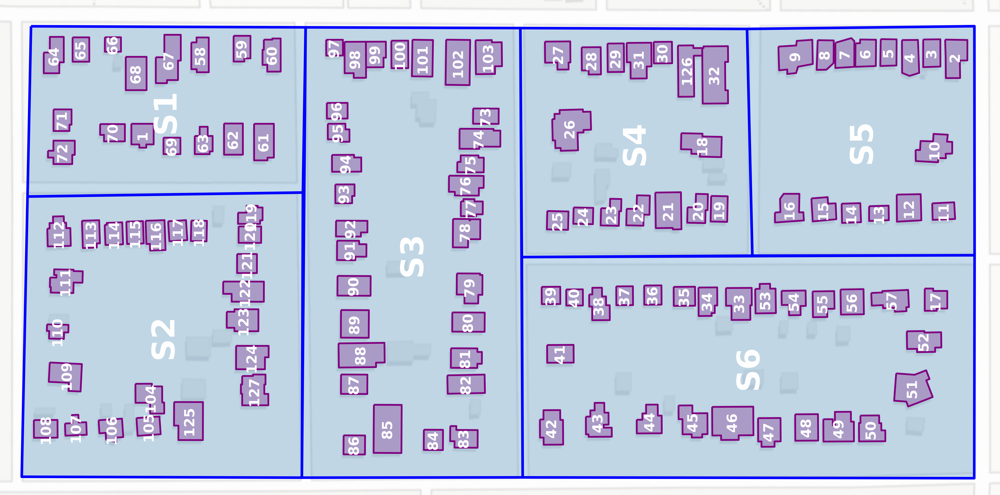

In [43]:
img_baseline= Image.open(fp='Background_numbered_buildings.png')


left = 3375
top = 5790
right = 9750
bottom = 8950

img_baseline = img_baseline.rotate(-18,resample=Image.BICUBIC, expand = True)
# Gives an order of magnitude for the pixels to crop
print(img_baseline.size)
img_baseline = img_baseline.crop((left, top, right, bottom))

#img_baseline.save('labeled_buildings_vertical.png')

img_baseline

## GWP map

In [36]:
# Pair scores with relevant ids : 
coord_ind = np.array([int(x) for x in coord_mapper.keys()])
coord_df = pd.DataFrame(coord_mapper, index = coord_ind)

In [ ]:
# LCIA method 1 : 
method = selected_LCIA[-1]

print(method)
method_results = summary_df.loc[method]['Total']
method_results = method_results.unstack().sum(axis=1)


display_df = pd.DataFrame(archetypes).T
display_df['score'] = method_results

x = display_df['Lon'].values
y = display_df['Lat'].values
score = display_df['score'].values

norm_score = score/score.max()


# mark outliers : 
z = pd.Series(np.abs(scipy.stats.zscore(display_df['score'])))
z_masked = z[z<2] # get rid of outliers
z_ind = z_masked.index+1
non_outliers = display_df['score'][z_ind]


non_outliers_mean_GWP = non_outliers.mean()
non_outliers_median = np.median(non_outliers)

print('Non outlier Mean :',non_outliers_mean_GWP)
print('Non outlier Median :',non_outliers_median)
print('Total mean :',display_df['score'].mean())


display_df['point'] = buildings['point']

center_lat = y.sum()/len(y)
center_lon = x.sum()/len(x)


m = folium.Map(location=(center_lat, center_lon), tiles="CartoDB.PositronNoLabels", zoom_start=17)

show_sectors = True
show_houses = True


if show_sectors == True : 
    # Add sectors as the background :
    for sector in sector_bounds.keys() : 

        polygon = Polygon([x for x in sector_bounds[sector]])
        sector_df = display_df[display_df['point'].apply(polygon.contains)].copy()

        sector_score = sector_df['score'].mean()
        print(sector_df['score'].sum(),sector_score, len(sector_df['score']))

        color = matplotlib.colors.rgb2hex(custom_cmap_segmented((sector_score-non_outliers.min())/(non_outliers.max()-non_outliers.min())))

        folium.GeoJson(
            polygon,
            color = color,
            tooltip=folium.Tooltip ([float(sector_score),sector],sticky = False),
                      ).add_to(m)



if show_houses == True : 
    # Add buildings on top of sectors : 
    
    for i,points in enumerate(score) :    
        geo_id = coord_mapper[i+1]

        geo_data = [geo for geo in filtered_geojson_data['features'] if geo['properties']['id'] == geo_id]    
        dummy_geo_data = {'features':geo_data, 'type':'FeatureCollection'}

        color = matplotlib.colors.rgb2hex(custom_cmap_segmented((points-non_outliers.min())/(non_outliers.max()-non_outliers.min())))
  
        
        g = folium.GeoJson(
            dummy_geo_data,
            name="geojson",
            style_function=lambda x: {"fillOpacity": 0.5},
            tooltip=folium.Tooltip ([float(score[i]),int(i+1)],sticky = False),
            color = color,
        ).add_to(m)
    
m


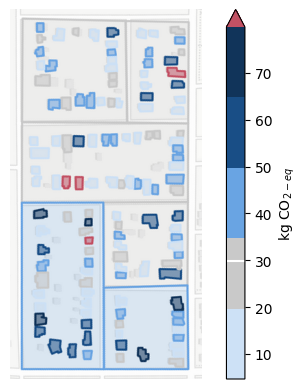

In [38]:
img_data = m._to_png(5)
img = Image.open(io.BytesIO(img_data))

left = 535
right = 815
top = 125
bottom = 665

im1 = img.rotate(-108,resample=Image.BICUBIC)
im1 = im1.crop((left, top, right, bottom))

fig, axs = plt.subplots(1,1) #,figsize= (10,10))
axs.axis('off')
axs.axis('off')
axs.imshow(im1)

# Score without outliers :
norm_GWP = matplotlib.colors.Normalize(vmin=non_outliers.min(), vmax= non_outliers.max())
norm_GWP50 = matplotlib.colors.Normalize(vmin=non_outliers.min()*50, vmax= non_outliers.max()*50)

# Score without outliers, dropped from mean :
cbar_GWP = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm_GWP, cmap=custom_cmap_segmented),
             ax=axs, orientation='vertical', label='kg CO$_{2-eq}$',extend='max')

cbar_GWP.ax.axhline(non_outliers.mean(), c='w')


#fig.savefig('Portfolio_map_IPCC.png', format='png', dpi=300)

## GWP map - static version

In [ ]:
# LCIA method 1 : 
method = selected_LCIA[-1]

print(method)
method_results = summary_df.loc[method]['Total']
method_results = method_results.unstack().sum(axis=1)


display_df = pd.DataFrame(archetypes).T
display_df['score'] = method_results

x = display_df['Lon'].values
y = display_df['Lat'].values
score = display_df['score'].values

# mark outliers : 
z = pd.Series(np.abs(scipy.stats.zscore(display_df['score'])))
z_masked = z[z<2] # get rid of outliers
z_ind = z_masked.index+1
non_outliers = display_df['score'][z_ind]


non_outliers_mean_GWP = non_outliers.mean()
non_outliers_median = np.median(non_outliers)

display_df['point'] = buildings['point']

# Add the house scores and corresponding colors to the Geopandas dataframe : 
GWP_scores = []
GWP_colors = []

for i,val in gdf_f.iterrows() : 
    points = display_df.iloc[i,2]  
    GWP_scores.append(points)
    color = matplotlib.colors.rgb2hex(custom_cmap_segmented((points-non_outliers.min())/(non_outliers.max()-non_outliers.min())))
    GWP_colors.append(color)
    
gdf_f['GWP scores'] = GWP_scores
gdf_f['GWP colors'] = GWP_colors

# Add the sector scores 

GWP_sector_scores = []
GWP_sector_colors = []

for sector in sector_bounds.keys() : 
    polygon = Polygon([x for x in sector_bounds[sector]])
    sector_df = display_df[display_df['point'].apply(polygon.contains)].copy()

    sector_score = sector_df['score'].mean()
    color = matplotlib.colors.rgb2hex(custom_cmap_segmented((sector_score-non_outliers.min())/(non_outliers.max()-non_outliers.min())))
    GWP_sector_scores.append(sector_score)
    GWP_sector_colors.append(color)
    
sector_gdf['GWP sector scores'] = GWP_sector_scores
sector_gdf['GWP sector colors'] = GWP_sector_colors

ls_GWP_zorders = [cmap_zorders[x.upper()] for x in sector_gdf['GWP sector colors']]
sector_gdf['GWP sector zorders'] = ls_GWP_zorders
display(sector_gdf)

# Plot version of the sector gdf needs to be pre-sorted according to desired zorder :
sector_gdf_GWP_sorted = sector_gdf.copy().sort_values('GWP sector zorders')

# Figure
fig, ax = plt.subplots(1, 1, figsize = (12,16))

# Figure content
sector_gdf_GWP_sorted.boundary.plot(ax = ax, color = sector_gdf_GWP_sorted['GWP sector colors'], alpha = 0.95,linewidth = 5)
sector_gdf_GWP_sorted.plot(ax=ax,alpha=0.2, color = sector_gdf_GWP_sorted['GWP sector colors'])


gdf_f.boundary.plot(ax = ax, color = gdf_f['GWP colors'],linewidth = 3)
gdf_f.plot(ax=ax,alpha=0.7, color = gdf_f['GWP colors'])
cx.add_basemap(ax = ax, crs=gdf_f.crs,source=cx.providers.CartoDB.PositronNoLabels,zoom = 18)


# Figure format :
ax.set_axis_off()
# Adjust plot obunds : 
current_bounds = sector_gdf.total_bounds
            # MIN                             # MAX
ax.set(xlim = (current_bounds[0]-0.00025, current_bounds[2]+0.0005),
       ylim = (current_bounds[1]-0.0005, current_bounds[3]+0.0002)
       )
#im_GWP = fig.savefig('Background_map_GWP.png', format='png', dpi=300)

## Human health map

In [ ]:
# LCIA method 2 : 
method = selected_LCIA[-2]

print(method)
method_results = summary_df.loc[method]['Total']
method_results = method_results.unstack().sum(axis=1)


display_df = pd.DataFrame(archetypes).T
display_df['score'] = method_results

x = display_df['Lon'].values
y = display_df['Lat'].values
score = display_df['score'].values

norm_score = score/score.max()


# mark outliers : 
z = pd.Series(np.abs(scipy.stats.zscore(display_df['score'])))
z_masked = z[z<2] # get rid of outliers
z_ind = z_masked.index+1
non_outliers = display_df['score'][z_ind]


non_outliers_mean_HH = non_outliers.mean()
non_outliers_median = np.median(non_outliers)

print('Non outlier Mean :',non_outliers_mean_HH)
print('Non outlier Median :',non_outliers_median)
print('Total mean :',display_df['score'].mean())


display_df['point'] = buildings['point']

center_lat = y.sum()/len(y)
center_lon = x.sum()/len(x)


m = folium.Map(location=(center_lat, center_lon), tiles="CartoDB.PositronNoLabels", zoom_start=17)

show_sectors = True
show_houses = True


if show_sectors == True : 
    # Add sectors as the background :
    for sector in sector_bounds.keys() : 

        polygon = Polygon([x for x in sector_bounds[sector]])
        sector_df = display_df[display_df['point'].apply(polygon.contains)].copy()

        sector_score = sector_df['score'].mean()
        print(sector_df['score'].sum(),sector_score, len(sector_df['score']))

        color = matplotlib.colors.rgb2hex(custom_cmap_segmented((sector_score-non_outliers.min())/(non_outliers.max()-non_outliers.min())))

        folium.GeoJson(
            polygon,
            color = color,
            tooltip=folium.Tooltip ([float(sector_score),sector],sticky = False),
                      ).add_to(m)

if show_houses == True : 
    # Add buildings on top of sectors : 
    
    for i,points in enumerate(score) :    
        geo_id = coord_mapper[i+1]

        geo_data = [geo for geo in filtered_geojson_data['features'] if geo['properties']['id'] == geo_id]    
        dummy_geo_data = {'features':geo_data, 'type':'FeatureCollection'}

        color = matplotlib.colors.rgb2hex(custom_cmap_segmented((points-non_outliers.min())/(non_outliers.max()-non_outliers.min())))
  
        g = folium.GeoJson(
            dummy_geo_data,
            name="geojson",
            style_function=lambda x: {"fillOpacity": 0.5},
            tooltip=folium.Tooltip ([float(score[i]),int(i+1)],sticky = False),
            color = color,
        ).add_to(m)
    
m

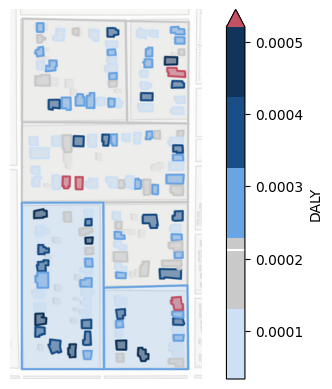

In [43]:
img_data = m._to_png(5)
img = Image.open(io.BytesIO(img_data))

left = 535
right = 815
top = 125
bottom = 665

im1 = img.rotate(-108,resample=Image.BICUBIC)
im1 = im1.crop((left, top, right, bottom))

fig, axs = plt.subplots(1,1)
axs.axis('off')
axs.axis('off')
axs.imshow(im1)

# Score without outliers :
norm_HH = matplotlib.colors.Normalize(vmin=non_outliers.min(), vmax= non_outliers.max())
norm_HH50 = matplotlib.colors.Normalize(vmin=non_outliers.min()*50, vmax= non_outliers.max()*50)

# Score without outliers, dropped from mean :
cbar_HH = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm_HH, cmap=custom_cmap_segmented),
             ax=axs, orientation='vertical', label='DALY',extend='max')
cbar_HH.ax.axhline(non_outliers.mean(), c='w')

#fig.savefig('Portfolio_map_DALY.png', format='png', dpi=300)

## Human health map - static version

In [ ]:
# LCIA method 1 : 
method = selected_LCIA[-2]

print(method)
method_results = summary_df.loc[method]['Total']
method_results = method_results.unstack().sum(axis=1)


display_df = pd.DataFrame(archetypes).T
display_df['score'] = method_results

x = display_df['Lon'].values
y = display_df['Lat'].values
score = display_df['score'].values

# mark outliers : 
z = pd.Series(np.abs(scipy.stats.zscore(display_df['score'])))
z_masked = z[z<2] # get rid of outliers
z_ind = z_masked.index+1
non_outliers = display_df['score'][z_ind]


non_outliers_mean_HH = non_outliers.mean()
non_outliers_median = np.median(non_outliers)

display_df['point'] = buildings['point']

# Add the house scores and corresponding colors to the Geopandas dataframe : 
HH_scores = []
HH_colors = []

for i,val in gdf_f.iterrows() : 
    points = display_df.iloc[i,2]  
    HH_scores.append(points)
    color = matplotlib.colors.rgb2hex(custom_cmap_segmented((points-non_outliers.min())/(non_outliers.max()-non_outliers.min())))
    HH_colors.append(color)
    
gdf_f['HH scores'] = HH_scores
gdf_f['HH colors'] = HH_colors

# Add the sector scores 

HH_sector_scores = []
HH_sector_colors = []

for sector in sector_bounds.keys() : 
    polygon = Polygon([x for x in sector_bounds[sector]])
    sector_df = display_df[display_df['point'].apply(polygon.contains)].copy()

    sector_score = sector_df['score'].mean()
    color = matplotlib.colors.rgb2hex(custom_cmap_segmented((sector_score-non_outliers.min())/(non_outliers.max()-non_outliers.min())))
    HH_sector_scores.append(sector_score)
    HH_sector_colors.append(color)
    
sector_gdf['HH sector scores'] = HH_sector_scores
sector_gdf['HH sector colors'] = HH_sector_colors

ls_HH_zorders = [cmap_zorders[x.upper()] for x in sector_gdf['HH sector colors']]
sector_gdf['HH sector zorders'] = ls_HH_zorders
display(sector_gdf)

# Plot version of the sector gdf needs to be pre-sorted according to desired zorder :
sector_gdf_HH_sorted = sector_gdf.copy().sort_values('HH sector zorders')

# Figure
fig, ax = plt.subplots(1, 1, figsize = (12,16))

# Figure content
sector_gdf_HH_sorted.boundary.plot(ax = ax, color = sector_gdf_HH_sorted['HH sector colors'], alpha = 0.95,linewidth = 5)
sector_gdf_HH_sorted.plot(ax=ax,alpha=0.2, color = sector_gdf_HH_sorted['HH sector colors'])


gdf_f.boundary.plot(ax = ax, color = gdf_f['HH colors'],linewidth = 3)
gdf_f.plot(ax=ax,alpha=0.7, color = gdf_f['HH colors'])
cx.add_basemap(ax = ax, crs=gdf_f.crs,source=cx.providers.CartoDB.PositronNoLabels,zoom = 18)


# Figure format :
ax.set_axis_off()
# Adjust plot obunds : 
current_bounds = sector_gdf.total_bounds
            # MIN                             # MAX
ax.set(xlim = (current_bounds[0]-0.00025, current_bounds[2]+0.0005),
       ylim = (current_bounds[1]-0.0005, current_bounds[3]+0.0002)
       )
#im_HH = fig.savefig('Background_map_HH.png', format='png', dpi=300)

## Ecosystem quality map

In [ ]:
# LCIA method 3 : 
method = selected_LCIA[-3]
print(method)
method_results = summary_df.loc[method]['Total']
method_results = method_results.unstack().sum(axis=1)


display_df = pd.DataFrame(archetypes).T
display_df['score'] = method_results

x = display_df['Lon'].values
y = display_df['Lat'].values
score = display_df['score'].values

norm_score = score/score.max()


# mark outliers : 
z = pd.Series(np.abs(scipy.stats.zscore(display_df['score'])))
z_masked = z[z<2] # get rid of outliers
z_ind = z_masked.index+1
non_outliers = display_df['score'][z_ind]


non_outliers_mean_EQ = non_outliers.mean()
non_outliers_median = np.median(non_outliers)

print('Non outlier Mean :',non_outliers_mean_EQ)
print('Non outlier Median :',non_outliers_median)
print('Total mean :',display_df['score'].mean())


display_df['point'] = buildings['point']

center_lat = y.sum()/len(y)
center_lon = x.sum()/len(x)


m = folium.Map(location=(center_lat, center_lon), tiles="CartoDB.PositronNoLabels", zoom_start=17)

show_sectors = True
show_houses = True


if show_sectors == True : 
    # Add sectors as the background :
    for sector in sector_bounds.keys() : 

        polygon = Polygon([x for x in sector_bounds[sector]])
        sector_df = display_df[display_df['point'].apply(polygon.contains)].copy()

        sector_score = sector_df['score'].mean()
        print(sector_df['score'].sum(),sector_score, len(sector_df['score']))

        color = matplotlib.colors.rgb2hex(custom_cmap_segmented((sector_score-non_outliers.min())/(non_outliers.max()-non_outliers.min())))

        folium.GeoJson(
            polygon,
            color = color,
            tooltip=folium.Tooltip ([float(sector_score),sector],sticky = False),
                      ).add_to(m)



if show_houses == True : 
    # Add buildings on top of sectors : 
    
    for i,points in enumerate(score) :    
        geo_id = coord_mapper[i+1]

        geo_data = [geo for geo in filtered_geojson_data['features'] if geo['properties']['id'] == geo_id]    
        dummy_geo_data = {'features':geo_data, 'type':'FeatureCollection'}

        color = matplotlib.colors.rgb2hex(custom_cmap_segmented((points-non_outliers.min())/(non_outliers.max()-non_outliers.min())))
  
        
        g = folium.GeoJson(
            dummy_geo_data,
            name="geojson",
            style_function=lambda x: {"fillOpacity": 0.5},
            tooltip=folium.Tooltip ([float(score[i]),int(i+1)],sticky = False),
            color = color,
        ).add_to(m)
    
m

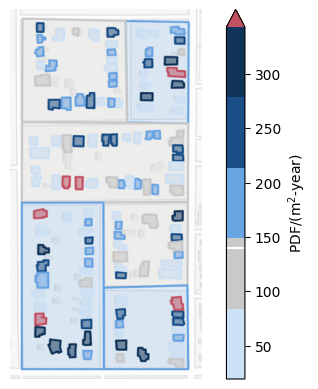

In [48]:
img_data = m._to_png(5)
img = Image.open(io.BytesIO(img_data))

left = 535
right = 815
top = 125
bottom = 665

im1 = img.rotate(-108,resample=Image.BICUBIC)
im1 = im1.crop((left, top, right, bottom))

fig, axs = plt.subplots(1,1)
axs.axis('off')
axs.axis('off')
axs.imshow(im1)

# Score without outliers :
norm_EQ = matplotlib.colors.Normalize(vmin=non_outliers.min(), vmax= non_outliers.max())
norm_EQ50 = matplotlib.colors.Normalize(vmin=non_outliers.min()*50, vmax= non_outliers.max()*50)


# Score without outliers, dropped from mean :
cbar_EQ = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm_EQ, cmap=custom_cmap_segmented),
             ax=axs, orientation='vertical',label='PDF/(m$^2$-year)',extend='max')
cbar_EQ.ax.axhline(non_outliers.mean(), c='w')
#fig.savefig('Portfolio_map_PDF.png', format='png', dpi=300)

## Ecosystem quality - static map

In [ ]:
# LCIA method 1 : 
method = selected_LCIA[-3]

print(method)
method_results = summary_df.loc[method]['Total']
method_results = method_results.unstack().sum(axis=1)


display_df = pd.DataFrame(archetypes).T
display_df['score'] = method_results

x = display_df['Lon'].values
y = display_df['Lat'].values
score = display_df['score'].values

# mark outliers : 
z = pd.Series(np.abs(scipy.stats.zscore(display_df['score'])))
z_masked = z[z<2] # get rid of outliers
z_ind = z_masked.index+1
non_outliers = display_df['score'][z_ind]


non_outliers_mean_EQ = non_outliers.mean()
non_outliers_median = np.median(non_outliers)

display_df['point'] = buildings['point']

# Add the house scores and corresponding colors to the Geopandas dataframe : 
EQ_scores = []
EQ_colors = []

for i,val in gdf_f.iterrows() : 
    points = display_df.iloc[i,2]  
    EQ_scores.append(points)
    color = matplotlib.colors.rgb2hex(custom_cmap_segmented((points-non_outliers.min())/(non_outliers.max()-non_outliers.min())))
    EQ_colors.append(color)
    
gdf_f['EQ scores'] = EQ_scores
gdf_f['EQ colors'] = EQ_colors

# Add the sector scores 

EQ_sector_scores = []
EQ_sector_colors = []

for sector in sector_bounds.keys() : 
    polygon = Polygon([x for x in sector_bounds[sector]])
    sector_df = display_df[display_df['point'].apply(polygon.contains)].copy()

    sector_score = sector_df['score'].mean()
    color = matplotlib.colors.rgb2hex(custom_cmap_segmented((sector_score-non_outliers.min())/(non_outliers.max()-non_outliers.min())))
    EQ_sector_scores.append(sector_score)
    EQ_sector_colors.append(color)
    
sector_gdf['EQ sector scores'] = EQ_sector_scores
sector_gdf['EQ sector colors'] = EQ_sector_colors

ls_eq_zorders = [cmap_zorders[x.upper()] for x in sector_gdf['EQ sector colors']]
sector_gdf['EQ sector zorders'] = ls_eq_zorders
display(sector_gdf)

# Plot version of the sector gdf needs to be pre-sorted according to desired zorder :
sector_gdf_eq_sorted = sector_gdf.copy().sort_values('EQ sector zorders')

# Figure
fig, ax = plt.subplots(1, 1, figsize = (12,16))

# Figure content
sector_gdf_eq_sorted.boundary.plot(ax = ax, color = sector_gdf_eq_sorted['EQ sector colors'], alpha = 0.95,linewidth = 5)
sector_gdf_eq_sorted.plot(ax=ax,alpha=0.2, color = sector_gdf_eq_sorted['EQ sector colors'])


gdf_f.boundary.plot(ax = ax, color = gdf_f['EQ colors'],linewidth = 3)
gdf_f.plot(ax=ax,alpha=0.7, color = gdf_f['EQ colors'])
cx.add_basemap(ax = ax, crs=gdf_f.crs,source=cx.providers.CartoDB.PositronNoLabels,zoom = 18)


# Figure format :
ax.set_axis_off()
# Adjust plot obunds : 
current_bounds = sector_gdf.total_bounds
            # MIN                             # MAX
ax.set(xlim = (current_bounds[0]-0.00025, current_bounds[2]+0.0005),
       ylim = (current_bounds[1]-0.0005, current_bounds[3]+0.0002)
       )
#im_EQ = fig.savefig('Background_map_PDF.png', format='png', dpi=300)

## Unifying static figure

In [57]:
Method_labels = [
    "IPCC 2021 - GWP100",
    "IW+ (2.0.1) Ecosystem Quality",
    "IW+ (2.0.1) Human Health"
]

In [52]:
img_GWP= Image.open(fp='Background_map_GWP.png')
img_HH = Image.open(fp='Background_map_HH.png')
img_EQ = Image.open(fp='Background_map_PDF.png')



# Gives an order of magnitude for the pixels to crop
print(img_EQ.size)

left = 6050
top = 3325
right = 9425
bottom = 9800

img_GWP = img_GWP.rotate(-108,resample=Image.BICUBIC, expand = True)
img_GWP = img_GWP.crop((left, top, right, bottom))

img_HH = img_HH.rotate(-108,resample=Image.BICUBIC, expand = True)
img_HH = img_HH.crop((left, top, right, bottom))


img_EQ = img_EQ.rotate(-108,resample=Image.BICUBIC, expand = True)
img_EQ = img_EQ.crop((left, top, right, bottom))

C:\Users\xtang\anaconda3\envs\brails1\Lib\site-packages\PIL\Image.py:3432: DecompressionBombWarning: Image size (122880000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


(9600, 12800)


(-0.5, 3374.5, 6474.5, -0.5)

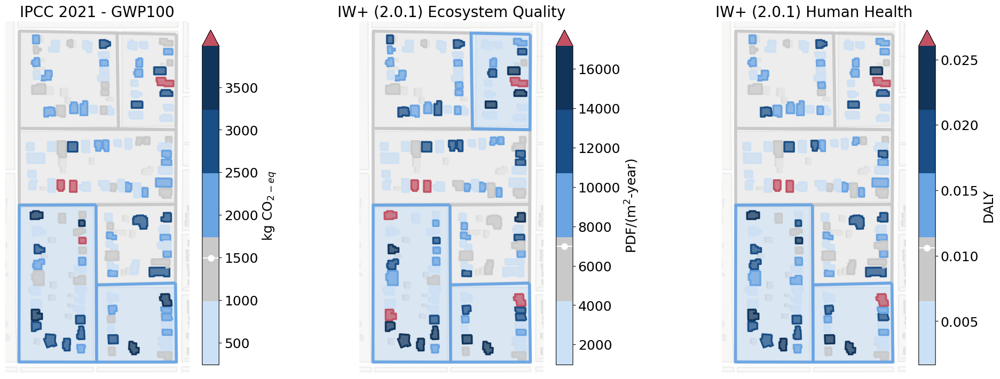

In [62]:
fig, axs = plt.subplots(1,3,figsize= (20,7),layout = 'constrained')

cbar_shrink_factor = 0.95
cbar_fontsize= 18

im_GWP = axs[0].imshow(img_GWP)

cbar_GWP = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm_GWP50, cmap=custom_cmap_segmented),
             ax=axs[0], orientation='vertical', label='kg CO$_{2-eq}$',extend='max',shrink = cbar_shrink_factor)
cbar_GWP.ax.tick_params(labelsize=cbar_fontsize)
cbar_GWP.set_label(label='kg CO$_{2-eq}$',size=cbar_fontsize)
cbar_GWP.ax.axhline(non_outliers_mean_GWP*50, c='w')
cbar_GWP.ax.plot(0.5, non_outliers_mean_GWP*50, 'wo', ms=8)

im_EQ = axs[1].imshow(img_EQ)
cbar_EQ = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm_EQ50, cmap=custom_cmap_segmented),
             ax=axs[1], orientation='vertical',label='PDF/(m$^2$-year)',extend='max',shrink = cbar_shrink_factor)
cbar_EQ.ax.tick_params(labelsize=cbar_fontsize)
cbar_EQ.set_label(label='PDF/(m$^2$-year)',size=cbar_fontsize)
cbar_EQ.ax.axhline(non_outliers_mean_EQ*50, c='w')
cbar_EQ.ax.plot(0.5, non_outliers_mean_EQ*50, 'wo', ms=8)

im_HH = axs[2].imshow(img_HH)
cbar_HH = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm_HH50, cmap=custom_cmap_segmented),
             ax=axs[2], orientation='vertical',label='DALY',extend='max',shrink = cbar_shrink_factor, extendrect = False)
cbar_HH.ax.tick_params(labelsize=cbar_fontsize)
cbar_HH.set_label(label='DALY',size=cbar_fontsize)
cbar_HH.ax.axhline(non_outliers_mean_HH*50, c='w')
cbar_HH.ax.plot(0.5, non_outliers_mean_HH*50, 'wo', ms=8)

axs[0].set_title(Method_labels[0],fontsize=20)
axs[1].set_title(Method_labels[1],fontsize=20)
axs[2].set_title(Method_labels[2],fontsize=20)

axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')


In [63]:
#fig.savefig('portoflio contributions.png', format='png', dpi=300)

In [92]:
for method in selected_LCIA : 
    
    print(method)
    method_results = summary_df.loc[method]['Total']
    method_results = method_results.unstack().sum(axis=1).sum()
    
    print(method_results)

('IMPACT World+ Damage 2.0.1', 'Ecosystem quality', 'Total ecosystem quality')
19346.834697965078
('IMPACT World+ Damage 2.0.1', 'Human health', 'Total human health')
0.029034995596010787
('IPCC 2021', 'climate change', 'global warming potential (GWP100)')
4171.184334921447


### Visualize results according to building id & MRI :

In [ ]:
CMP_MRI_df = pd.DataFrame()

for MRI in MC_results.keys() : 

    # Drop the archetype name
    df = MC_results[MRI].T.reset_index(level=3, drop=True)

    # Properly reformat the table, as intended : 
    L1 = []
    L2 = []
    L3 = []

    for item in df.index : 
        if MC_results_format != 'pickle' : 
            L1.append(ast.literal_eval(item[0]))
        else : 
            L1.append(item[0])
        L2.append(int(item[1]))
        L3.append(int(item[2]))
        tuples = list(zip(*[L1,L2,L3]))
    re_indexer = pd.MultiIndex.from_tuples(tuples, names=[None, None, None])
    
    # Get the total across all damage states, so it is only 1 impact per component
    df = df.groupby(level =[0,1]).sum().T
    
    MC_samples_count = df.shape[0]
    
    # Create a simulation mean for the relevant MRI : 
    df = pd.DataFrame(df.sum(axis =0)/MC_samples_count*MRI_lambdas[str(MRI)], columns = [MRI])    
    
    # Save the results to a variable :
    CMP_MRI_df = pd.concat([CMP_MRI_df,df],axis = 1)    
    
CMP_MRI_df = CMP_MRI_df.fillna(0).sort_index()
display(CMP_MRI_df)

In [ ]:
keywords_selected_LCIA_methods = ['IPCC','World+']

selected_LCIA = sorted(list(set([s for s in CMP_MRI_df.index.get_level_values(0) if any(substr in s[0] for substr in keywords_selected_LCIA_methods)])))

EALs = {}

LCIA_EAL = CMP_MRI_df.groupby(level = 0).sum().sum(axis =1)
LCIA_EAL

In [66]:
# Ensure the order is the same as other figures
Plot_order = {
    0:'GWP',
    1:'Ecosystem',
    2:'Human'
}

Method_labels = {
    'GWP':'IPCC 2021 - GWP100',
    'Ecosystem':'IW+ (2.0.1) Ecosystem Quality',
    'Human': 'IW+ (2.0.1) Human Health'
}


Two_line_Method_labels = {
    'GWP':'IPCC 2021 \n GWP100',
    'Ecosystem':'IW+ (2.0.1) \n Ecosystem Quality',
    'Human': 'IW+ (2.0.1) \n Human Health'   
 
}

Method_units = {
    0:'kg CO$_{2-eq}$',
    1:'PDF/(m$^2$-year)',
    2:'DALY',
}

### Bring added information : add a plot at the bottom

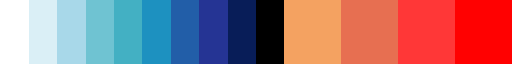

In [104]:
# Define your custom color palette
custom_listed_colors = [
    '#FFFFFF',
    '#DAEFF6',
    '#A8D8E9',
    '#6FC3D2',
    '#43B0C3',
    '#1D91C0',
'#225EA8',
'#253494',
'#081D58',
'#000000',
    '#f4a261', 
    '#f4a261',
    '#e76f51',
    '#e76f51',
'#FF3737',
'#FF3737',
'#FF0101',
'#FF0101',   
]

# Create a ListedColormap
custom_cmap_linear = ListedColormap(custom_listed_colors)
custom_cmap_linear.set_over('red')
custom_cmap_linear

In [106]:
CMP_df = pd.DataFrame()

for MRI in MC_results.keys() : 

    # Drop the archetype name
    df = MC_results[MRI].T.reset_index(level=3, drop=True)

    # Properly reformat the table, as intended : 
    L1 = []
    L2 = []
    L3 = []

    for item in df.index : 
        if MC_results_format != 'pickle' : 
            L1.append(ast.literal_eval(item[0]))
        else : 
            L1.append(item[0])
        L2.append(int(item[1]))
        L3.append(int(item[2]))
        tuples = list(zip(*[L1,L2,L3]))
    re_indexer = pd.MultiIndex.from_tuples(tuples, names=[None, None, None])

    # Get the total across all damage states, so it is only 1 impact per component
    df = df.groupby(level =[0,1]).sum().T
    
    MC_samples_count = df.shape[0]
    
    # Create a simulation mean for the relevant MRI : 
    df = pd.DataFrame(df.sum(axis =0)/MC_samples_count, columns = [MRI])    
    
    # Save the results to a variable :
    CMP_df = pd.concat([CMP_df,df],axis = 1)    

    
CMP_df = CMP_df.fillna(0).sort_index()
display(CMP_df)

19        27  \
(IMPACT World+ Damage 2.0.1, Ecosystem quality,... 1    0.131089  2.037983   
                                                   2    0.049403  0.389729   
                                                   3    0.062109  0.200066   
                                                   4    0.048252  0.519130   
                                                   5    0.169576  1.721245   
...                                                          ...       ...   
(ReCiPe 2016 v1.03, endpoint (H), total: natura... 123  0.029606  0.237001   
                                                   124  0.020451  0.233075   
                                                   125  0.000000  0.132485   
                                                   126  0.000000  0.000000   
                                                   127  0.068172  0.401165   

                                                               39          59  \
(IMPACT World+ Damage 2.0.1, Ecosystem quality,... 1    12.282337   94.595691   
                                                   2     3.247169   16.837333   
                                                   3     2.193459   11.084593   
                                                   4     2.802296   13.054362   
                                                   5     9.874773  105.143998   
...                                                           ...         ...   
(ReCiPe 2016 v1.03, endpoint (H), total: natura... 123   1.479113    7.440789   
                                                   124   1.475217    7.668880   
                                                   125   0.915846    4.608775   
                                                   126   0.609987    4.620942   
                                                   127   3.020571   13.429078   

                                                                92  \
(IMPACT World+ Damage 2.0.1, Ecosystem quality,... 1    641.378354   
                                                   2    101.669894   
                                                   3     39.232898   
                                                   4     55.087971   
                                                   5    462.442614   
...                                                            ...   
(ReCiPe 2016 v1.03, endpoint (H), total: natura... 123   23.693349   
                                                   124   25.472563   
                                                   125   17.588840   
                                                   126   27.365950   
                                                   127   43.006837   

                                                                149  \
(IMPACT World+ Damage 2.0.1, Ecosystem quality,... 1    2818.355559   
                                                   2     666.610437   
                                                   3     194.167824   
                                                   4     266.479200   
                                                   5    2978.494162   
...                                                             ...   
(ReCiPe 2016 v1.03, endpoint (H), total: natura... 123    69.767789   
                                                   124    70.844884   
                                                   125    49.935585   
                                                   126   124.752341   
                                                   127   117.975255   

                                                                 249  \
(IMPACT World+ Damage 2.0.1, Ecosystem quality,... 1    11102.983900   
                                                   2     2558.790606   
                                                   3      987.019352   
                                                   4     1180.331460   
                                                   5     9729.967621   
...                       

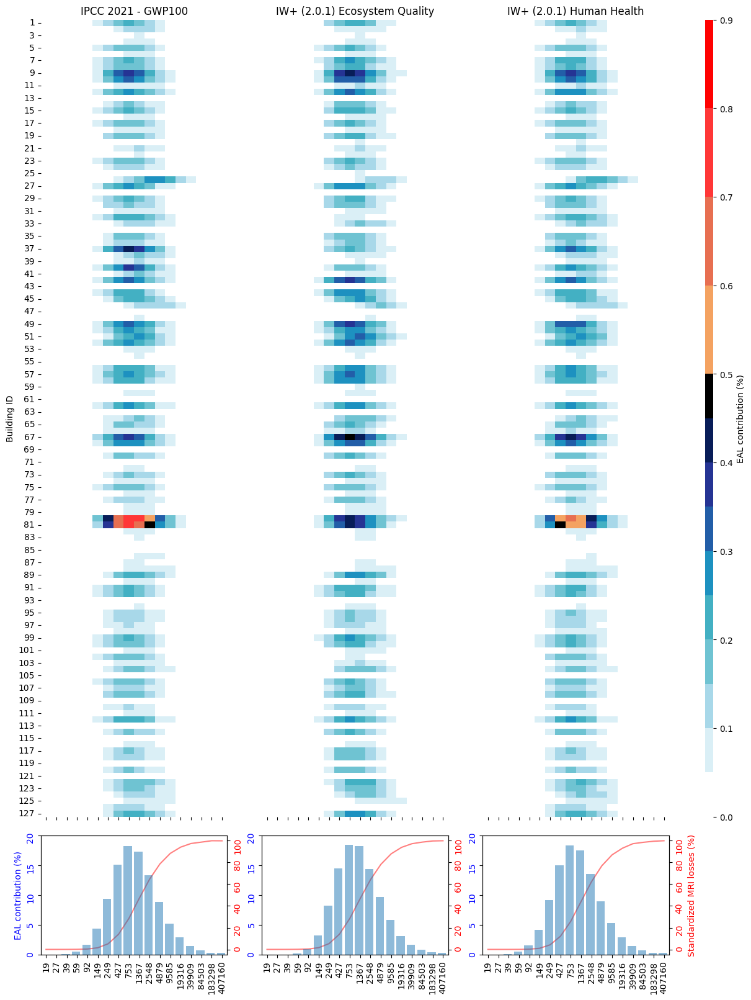

In [115]:
fig, axs = plt.subplots(2, 3, figsize = (12,16),
    gridspec_kw={'width_ratios': [1,1,1],'height_ratios':[1,0.15]},
                       sharex=True, sharey=False,
                       layout='constrained')


for row in range(axs.shape[0]) :     
    for col in range(axs.shape[1]) : 

        
        if (col >= 0) & (row == 0) : 
        
            lcia = [x for x in selected_LCIA if Plot_order[col] in str(x)]        
        
            normalized_ind = CMP_MRI_df.loc[lcia[0]]/LCIA_EAL[lcia[0]]*100  
            

            label = Method_labels[Plot_order[col]]            
            axs[row,col].set_title(f'{label}')             
  
            cbar_max = 0.9

            if col == 0 : 
                im = sns.heatmap(normalized_ind, cmap=custom_cmap_linear, cbar =  False, ax = axs[row,col],
                                                 linewidths=0,vmin=0, vmax=cbar_max
                           )
                axs[row,col].tick_params(left=True, bottom=True)        
                axs[row,col].set_ylabel('Building ID')


            elif col != len(selected_LCIA)-1 :

                im = sns.heatmap(normalized_ind, cmap=custom_cmap_linear, cbar =  False, ax = axs[row,col],
                                 linewidths=0,vmin=0, vmax=cbar_max,yticklabels=False
                           )
                axs[row,col].tick_params(left=False, bottom=True)

            else : 
                im = sns.heatmap(normalized_ind, cmap=custom_cmap_linear, linewidths=0,vmin=0, vmax=cbar_max, ax = axs[row,col],
                                 yticklabels=False,
                           cbar_kws={'label': 'EAL contribution (%)', 'aspect':'100'}                   

                           )      
                axs[row,col].tick_params(left=False, bottom=True)        
        
        if (col >= 0) & (row ==1) :
            MRI_losses = CMP_df.loc[lcia[0]].sum()/(CMP_df.loc[lcia[0]].sum().max())*100
            
            lcia = [x for x in selected_LCIA if Plot_order[col] in str(x)]  
            normalized_ind = (CMP_MRI_df.loc[lcia[0]]/LCIA_EAL[lcia[0]]*100).sum(axis=0)
            axs[row,col].bar(normalized_ind.index,normalized_ind.values,align='edge', alpha = 0.5)
            axs[row,col].set_ylim([0,20])
            axs[row,col].tick_params(labelrotation=90)
            axs[row,col].tick_params(axis='y',labelcolor='blue')
            if col == 0 : 
                axs[row,col].set_ylabel('EAL contribution (%)', color = 'blue')
                
            # Add the cumulative : 
            ax2 = axs[row,col].twinx()

            indexes = np.linspace(1,len(normalized_ind.index),num = len(normalized_ind.index))-0.5
            ax2.plot(indexes,MRI_losses.values,alpha = 0.5, color= 'red')
            
            ax2.tick_params(labelcolor='red',labelrotation=90)
            if col == 2 :
                ax2.set_ylabel('Standardized MRI losses (%)', color = 'red')
                
            axs[row,col].set_zorder(ax2.get_zorder()+1)
            axs[row,col].patch.set_visible(False)
#fig.savefig('portfolio_MRI_contrib.png',dpi=300)

## Add building ID perspective

In [ ]:
for i in range(len(selected_LCIA)):

    lcia = [x for x in selected_LCIA if Plot_order[i] in str(x)] 
    print(lcia)
    normalized_ind = CMP_MRI_df.loc[lcia[0]]/LCIA_EAL[lcia[0]]*100
    normalized_build = normalized_ind.sum(axis = 1)
    
    fig, axs = plt.subplots(1, 2, figsize = (8,16),
    gridspec_kw={'width_ratios': [0.5,1]},
                       sharex=False, sharey='row',
                       layout='constrained')
    
    
    for col in range(axs.shape[0]) :
        
        if col == 1 :
            im = sns.heatmap(normalized_ind, cmap=custom_cmap_linear, cbar =  True, ax = axs[col],
                                             linewidths=0,vmin=0, vmax=cbar_max,
                                            cbar_kws={'label': 'EAL contribution (%)', 'aspect':'100'} 
                       )
            axs[col].tick_params(left=False, bottom=True)
            axs[col].set_xlabel('MRI')
            for _, spine in im.spines.items():
                spine.set_visible(True)

        if col == 0 : 
            
            x_ticks = normalized_build.index
            x_tick_pos = [i + 0.5 for i in range(len(x_ticks))]
            
            
            axs[col].barh(x_tick_pos,normalized_build.values,align='center', alpha = 0.5, color = 'red')
            axs[col].invert_xaxis()
            axs[col].tick_params(left=True, bottom=True)        
            axs[col].set_ylabel('Building ID')
            axs[col].set_xlabel('Building contribution to EAL (%)')
    plt.show()
        
        
    
    

In [ ]:
fig, axs = plt.subplots(3, 1, figsize = (12,8),
                   sharex=True,
                   layout='constrained')


for i in range(len(selected_LCIA)):


    lcia = [x for x in selected_LCIA if Plot_order[i] in str(x)] 
    print(lcia)
    normalized_ind = CMP_MRI_df.loc[lcia[0]]/LCIA_EAL[lcia[0]]*100
    normalized_build = normalized_ind.sum(axis = 1)
    print(normalized_build.max())
    print(normalized_build.mean())
    print(normalized_build.std())

    x_ticks = normalized_build.index
    x_tick_pos = [i + 0.5 for i in range(len(x_ticks))]
    
    
    sns.barplot(x=normalized_build.index,y=normalized_build.values,hue=BRAILS_input['cladding'],ax=axs[i])
    
    axs[i].set_xticks(list(axs[i].get_xticks()))
    axs[i].set_xlim([-1,127])
    axs[i].set_ylim([0,5])
    axs[i].yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.0f'))
    axs[i].axhline(y=normalized_build.mean(),linewidth=1.5, color='grey',linestyle = '--', alpha = 0.75, label = 'Average')
 
    axs[i].grid(axis = 'y', alpha = 0.2)
    label = Method_labels[Plot_order[i]]            
    axs[i].set_ylabel(f'{label}')
    
    for ind, label in enumerate(axs[i].get_xticklabels()):
        if (ind+1) % 10 == 0:  # every 10th label is kept
            label.set_visible(True)
        else:
            label.set_visible(False) 



    if i == 0 : 
        axs[i].legend()
    else : 
        axs[i].legend().remove()
    
    if i == 2 : 
        axs[i].set_xlabel('Building ID') 

[('IPCC 2021', 'climate change', 'global warming potential (GWP100)')]
[('IMPACT World+ Damage 2.0.1', 'Ecosystem quality', 'Total ecosystem quality')]
[('IMPACT World+ Damage 2.0.1', 'Human health', 'Total human health')]


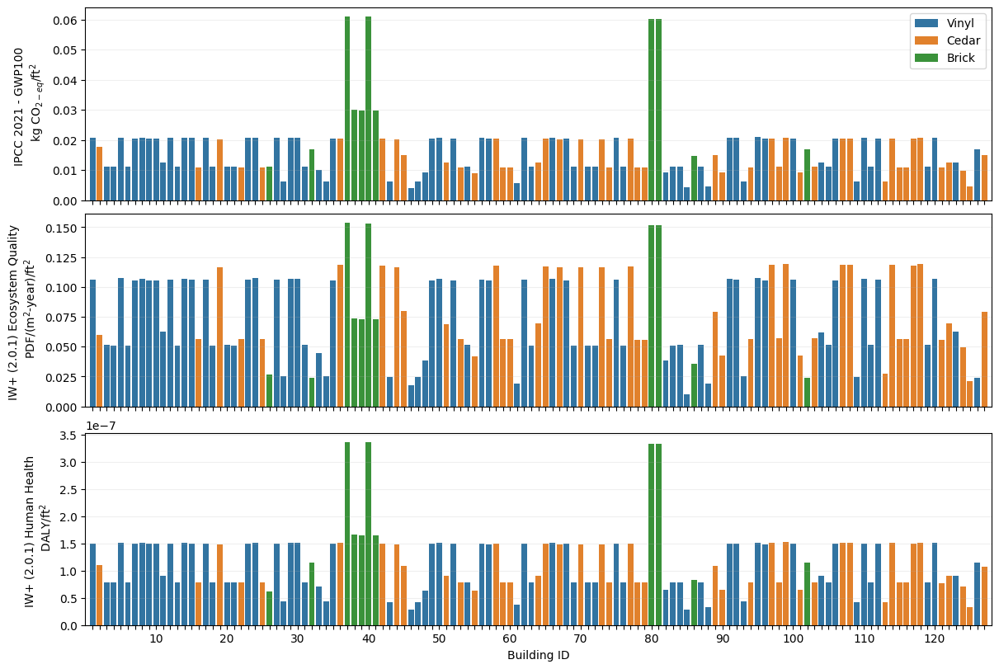

In [81]:
fig, axs = plt.subplots(3, 1, figsize = (12,8),
                   sharex=True,
                   layout='constrained')


for i in range(len(selected_LCIA)):


    lcia = [x for x in selected_LCIA if Plot_order[i] in str(x)] 
    print(lcia)
    scores = CMP_MRI_df.loc[lcia[0]].sum(axis=1)/(BRAILS_input['Total floor area'].values)

    x_ticks = normalized_build.index
    x_tick_pos = [i + 0.5 for i in range(len(x_ticks))]
    
    
    sns.barplot(x=scores.index,y=scores.values,hue=BRAILS_input['cladding'],ax=axs[i])
    
    axs[i].set_xticks(list(axs[i].get_xticks()))
    axs[i].set_xlim([-1,127])

    axs[i].grid(axis = 'y', alpha = 0.2)
    label = Method_labels[Plot_order[i]]            
    axs[i].set_ylabel(f'{label} \n {Method_units[i]}/ft$^2$')

    
    for ind, label in enumerate(axs[i].get_xticklabels()):
        if (ind+1) % 10 == 0:  # every 10th label is kept
            label.set_visible(True)
        else:
            label.set_visible(False) 

    if i == 0 : 
        axs[i].legend()
    else : 
        axs[i].legend().remove()
    
    if i == 2 : 
        axs[i].set_xlabel('Building ID') 

### Visualize results according to building id & DMG state contribution

In [88]:
CMP_DMG_df = pd.DataFrame()

for MRI in MC_results.keys() : 

    # Drop the archetype name
    df = MC_results[MRI].T.reset_index(level=3, drop=True)

    # Properly reformat the table, as intended : 
    L1 = []
    L2 = []
    L3 = []

    for item in df.index : 
        if MC_results_format != 'pickle' : 
            L1.append(ast.literal_eval(item[0]))
        else : 
            L1.append(item[0])
        L2.append(int(item[1]))
        L3.append(int(item[2]))
        tuples = list(zip(*[L1,L2,L3]))
    re_indexer = pd.MultiIndex.from_tuples(tuples, names=[None, None, None])
    
    # Re-index the dataframe
    df = pd.DataFrame(df.values, index =re_indexer, columns = df.columns) 

    MC_samples_count = df.shape[1]
    
    df = df.sum(axis = 1)/MC_samples_count*MRI_lambdas[str(MRI)]
    df = df.unstack(level = 2)    
    
    # Save the results to a variable :
    CMP_DMG_df = pd.concat([CMP_DMG_df,df],axis = 1)
    

CMP_DMG_df = CMP_DMG_df.fillna(0).sort_index()
CMP_DMG_df = CMP_DMG_df.groupby(CMP_DMG_df.columns, axis=1).sum()

    
display(CMP_DMG_df)

C:\Users\xtang\AppData\Local\Temp\ipykernel_4760\4085671988.py:40: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  CMP_DMG_df = CMP_DMG_df.groupby(CMP_DMG_df.columns, axis=1).sum()


1          2  \
(IMPACT World+ Damage 2.0.1, Ecosystem quality,... 1    9.866537  22.621870   
                                                   2    9.591925  17.503916   
                                                   3    6.467470  12.036718   
                                                   4    7.849677  14.485804   
                                                   5    8.751113  19.907370   
...                                                          ...        ...   
(ReCiPe 2016 v1.03, endpoint (H), total: natura... 123  2.734214   3.554651   
                                                   124  2.918204   4.292524   
                                                   125  3.211284   4.916270   
                                                   126  4.375484  14.129340   
                                                   127  3.340677   5.292215   

                                                                3            4  
(IMPACT World+ Damage 2.0.1, Ecosystem quality,... 1    12.553168  1190.897341  
                                                   2     5.596936   480.954111  
                                                   3     4.284597   265.777042  
                                                   4     4.961852   323.417905  
                                                   5    10.915932  1048.506765  
...                                                           ...          ...  
(ReCiPe 2016 v1.03, endpoint (H), total: natura... 123   2.132496    23.135307  
                                                   124   3.975628    17.383065  
                                                   125   2.751456     9.851640  
                                                   126  19.527925     0.002533  
                                                   127   5.090216    28.637455  

[762 rows x 4 columns]

[('IPCC 2021', 'climate change', 'global warming potential (GWP100)')]
99.99999999999997
3.8563935043761886
[('IMPACT World+ Damage 2.0.1', 'Ecosystem quality', 'Total ecosystem quality')]
99.99999999999994
2.38372311755817
[('IMPACT World+ Damage 2.0.1', 'Human health', 'Total human health')]
100.00000000000001
3.0404713526068843


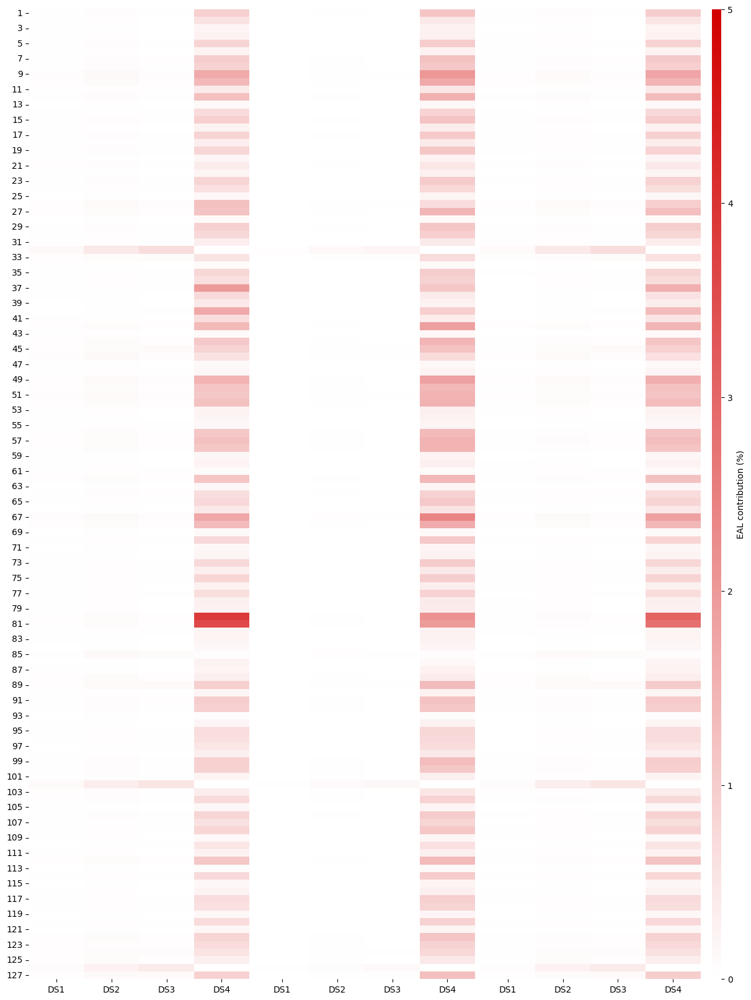

In [89]:
fig, axs = plt.subplots(1, 3,sharey=True, figsize = (12,16), layout = 'constrained')

for k, P in enumerate(Plot_order.items()):

    lcia = [x for x in selected_LCIA if P[1] in str(x)]
    print(lcia)
    
    normalized_ind = CMP_DMG_df.loc[lcia[0]]/LCIA_EAL[lcia[0]]*100  
    
    print(normalized_ind.sum().sum())
  

    print(normalized_ind.max().max())
    cbar_max = 5
    normalized_ind.columns = [f'DS{x}' for x in normalized_ind.columns]
    
    
    if k == 0 : 
        im = sns.heatmap(normalized_ind, cmap=custom_cmap_linear, cbar =  False, ax = axs[k],
                                         linewidths=0,vmin=0, vmax=cbar_max
                   )
        
    
    
    elif k != len(selected_LCIA)-1 :
        
        im = sns.heatmap(normalized_ind, cmap=custom_cmap_linear, cbar =  False, ax = axs[k],
                         linewidths=0,vmin=0, vmax=cbar_max
                   )
        axs[k].tick_params(left=False, bottom=True)
        
    else : 
        im = sns.heatmap(normalized_ind, cmap=custom_cmap_linear, linewidths=0,vmin=0, vmax=cbar_max, ax = axs[k],

                   cbar_kws={'label': 'EAL contribution (%)','aspect':'100'}                   
                   
                   )      
        axs[k].tick_params(left=False, bottom=True)